In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
data = pd.read_csv('house-prices-advanced-regression-techniques/train.csv')
data.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [28]:
def Cut_Data(data):
    categorial = data.select_dtypes(include=['object'])
    quantility = data.select_dtypes(exclude=['object'])
    quantility = quantility.drop(columns = ['OverallQual','OverallCond','FullBath','BsmtHalfBath','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars'])
    categorial = pd.concat([categorial,data[['OverallQual','OverallCond','FullBath','BsmtHalfBath','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars']]],axis = 1)
    return quantility,categorial

In [ ]:
quantility,categorial = Cut_Data(data)

In [21]:
categorial.columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'OverallQual', 'OverallCond', 'FullBath',
       'BsmtHalfBath', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars'],
      dtype='object')

In [22]:
quantility.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0
BsmtUnfSF,1460.0,567.240411,441.866955,0.0,223.00,477.5,808.00,2336.0


In [10]:
def spearman(frame, target):
    features = frame.columns
    spr = pd.DataFrame()
    spr['feature'] = features
    spr['spearman'] = [frame[f].corr(frame[target], 'spearman') for f in features]
    spr = spr.sort_values('spearman')
    plt.figure(figsize=(6, 0.25*len(features)))
    sns.barplot(data=spr, y='feature', x='spearman', orient='h')
    plt.show()
def basegrafsns(frame,features):
    subset = frame[features]
    sns.pairplot(subset)
    plt.show()
    sns.heatmap(subset.corr()
                ,cmap='RdBu_r', 
    annot=True, 
    vmin=-1, vmax=1); 
    plt.show()
def pipelinesns(data,features,target = None):
    
    basegrafsns(data,features) 
    if(target == None):
            return
    spearman(data[features], target)

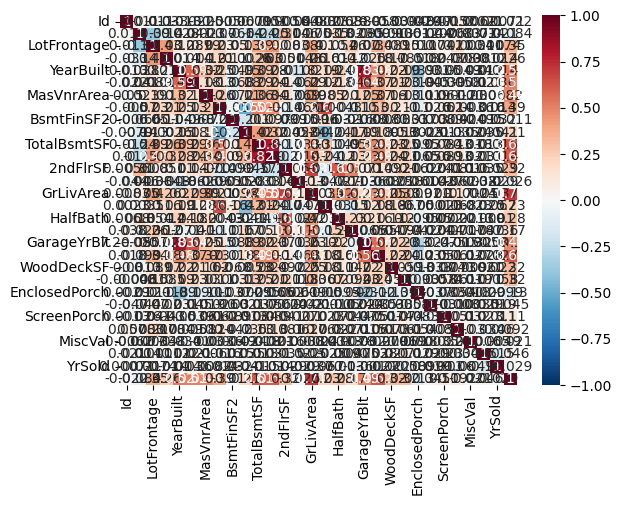

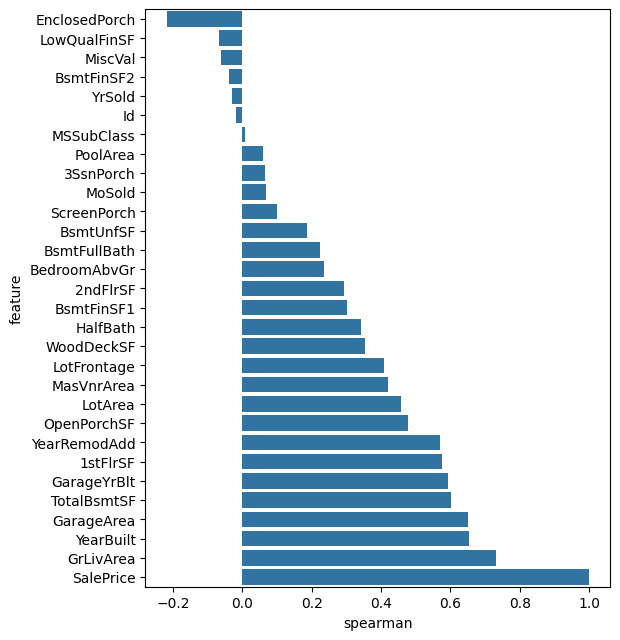

In [23]:
pipelinesns(quantility,quantility.columns,'SalePrice')

Обработка выбросов

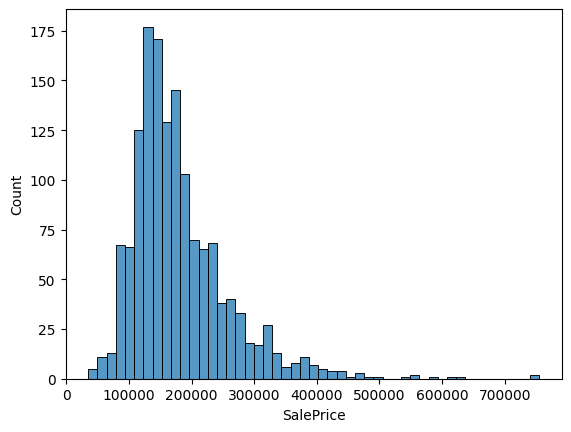

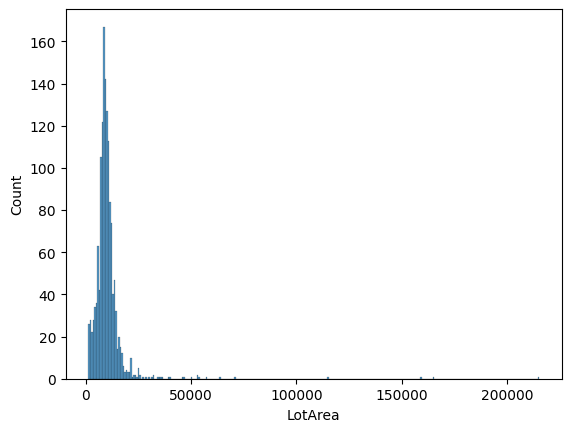

<Axes: xlabel='LotArea', ylabel='SalePrice'>

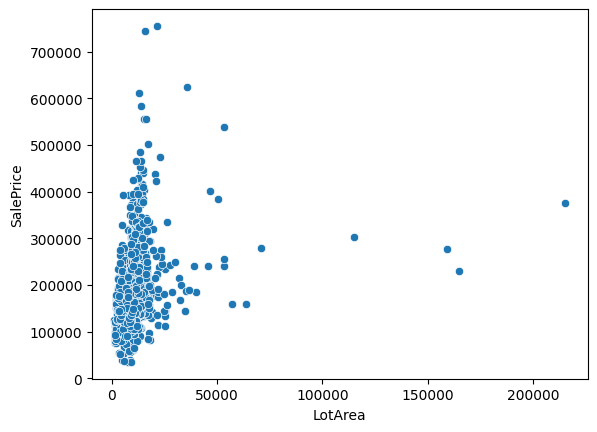

In [27]:
sns.histplot(data=quantility,x='SalePrice')
plt.show()
sns.histplot(data=quantility,x='LotArea')
plt.show()
sns.scatterplot(data=quantility,x='LotArea',y='SalePrice')

Значения больше 50000 тысяч не интресуют

In [29]:
quantility1 ,categorial1=Cut_Data(data[data['LotArea']<50000])

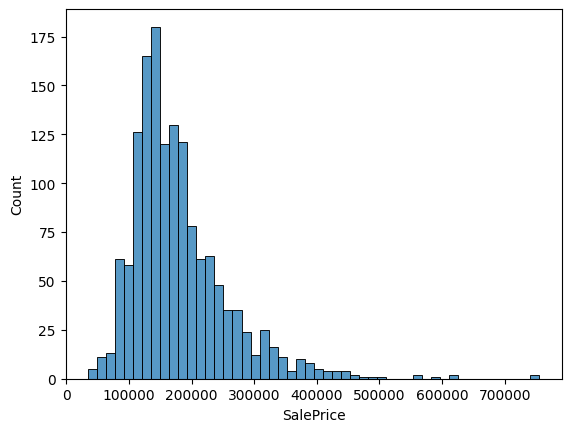

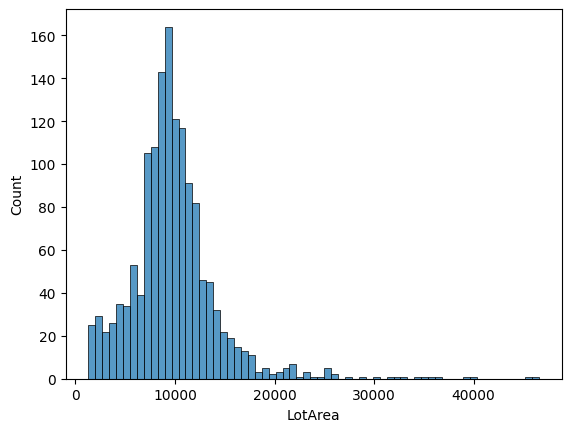

<Axes: xlabel='LotArea', ylabel='SalePrice'>

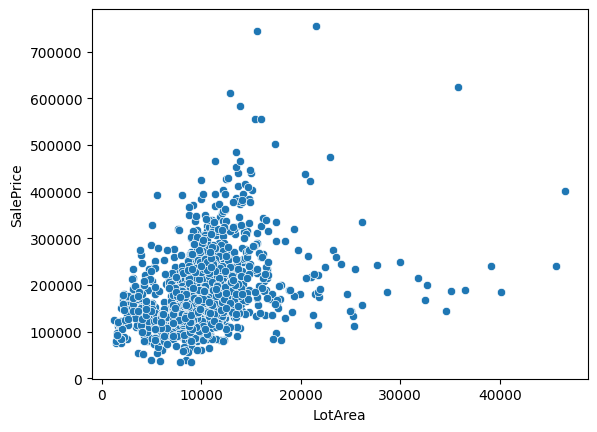

In [30]:
sns.histplot(data=quantility1,x='SalePrice')
plt.show()
sns.histplot(data=quantility1,x='LotArea')
plt.show()
sns.scatterplot(data=quantility1,x='LotArea',y='SalePrice')

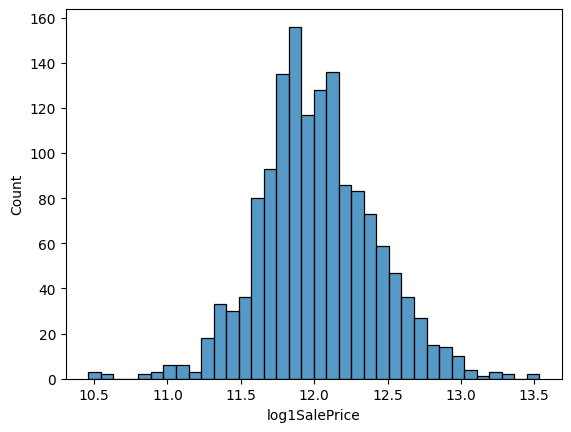

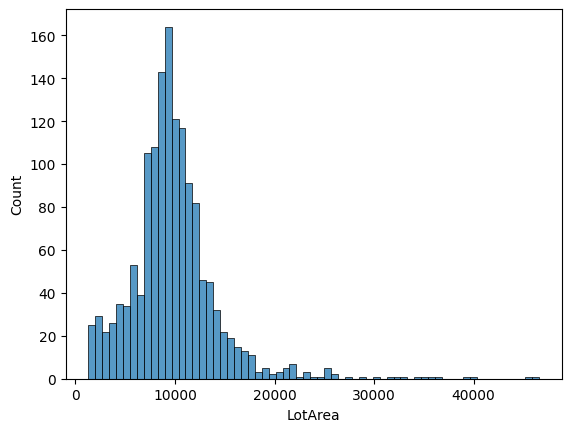

<Axes: xlabel='LotArea', ylabel='log1SalePrice'>

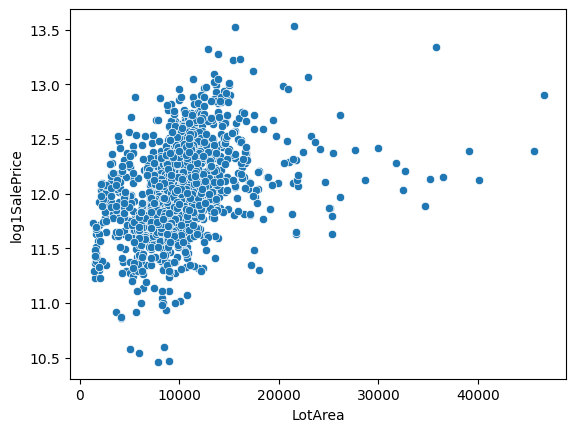

In [32]:
quantility1['log1SalePrice']=np.log1p(quantility1['SalePrice'])
sns.histplot(data=quantility1,x='log1SalePrice')
plt.show()
sns.histplot(data=quantility1,x='LotArea')
plt.show()
sns.scatterplot(data=quantility1,x='LotArea',y='log1SalePrice')

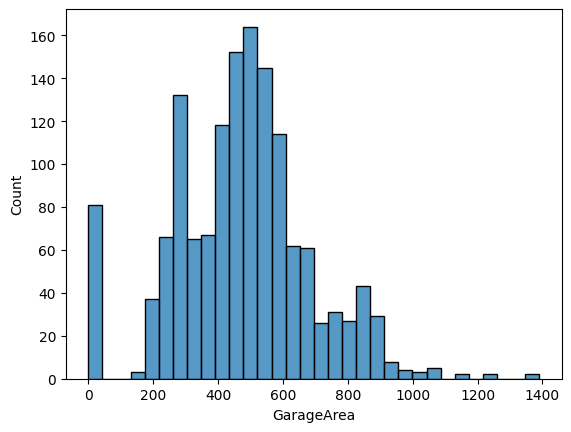

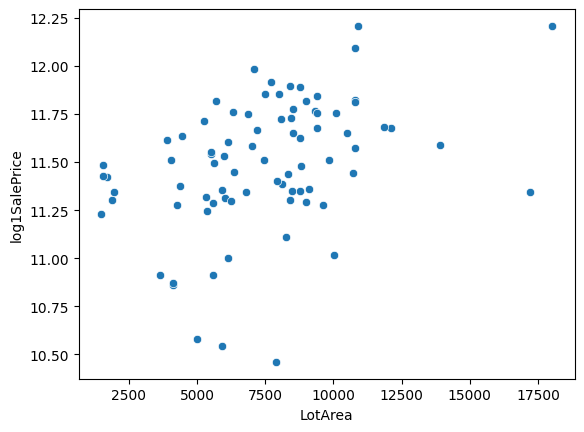

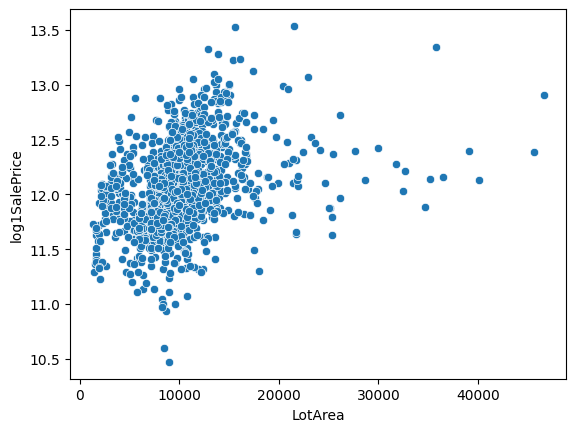

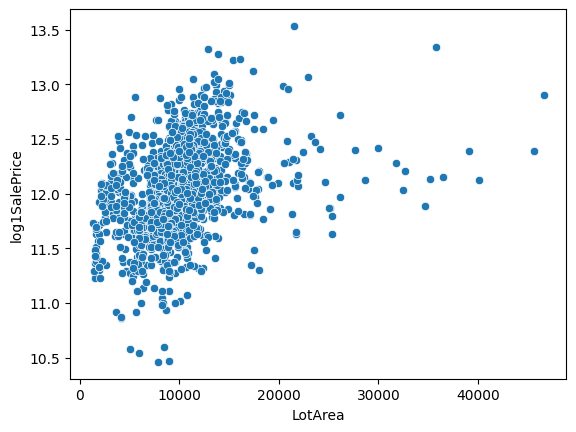

<Axes: xlabel='LotArea', ylabel='log1SalePrice'>

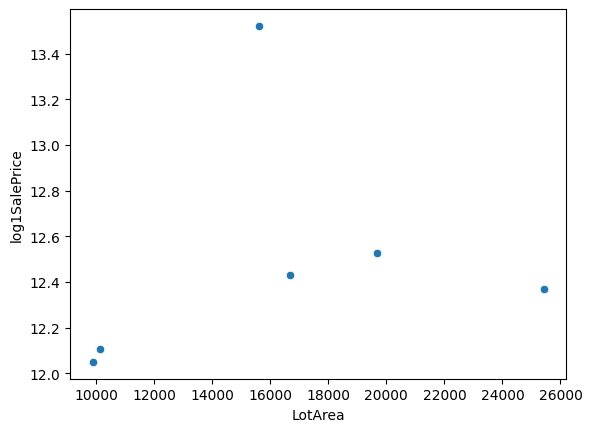

In [36]:
sns.histplot(data=quantility1,x='GarageArea')
plt.show()
sns.scatterplot(data=quantility1[quantility1['GarageArea']==0],x='LotArea',y='log1SalePrice')
plt.show()
sns.scatterplot(data=quantility1[quantility1['GarageArea']!=0],x='LotArea',y='log1SalePrice')
plt.show()
sns.scatterplot(data=quantility1[quantility1['PoolArea']==0],x='LotArea',y='log1SalePrice')
plt.show()
sns.scatterplot(data=quantility1[quantility1['PoolArea']!=0],x='LotArea',y='log1SalePrice')

В целом для BaseLine Все характеристики для Garage и Pool можно убрать не так это важно